# Creating New Images using Style Transfer and VGG16

## Topic

In this notebook I will attempt to create a new picture using two images (one content image and one style image) with the help of VGG16, which is a pretrained convolutional neural network with 16 layers that is comprised of sucessive convolution and maxpooling layers with 3 fully connected classifier layers (Although I won't be using the classifier part). The goal here is to pass images through the convolution part of the network and extract content features i.e the general shapes from one image, and style features from the other and combine these two through an iterative process to create a new image. So let's get started !

## Objectives

- Extract content and style features from images
- Create new pictures by combining the content and style of different images

## Summary

- Importing Libraries
- Loading the model
- Attempt 1: planets and cherry blossom
- Attempt 2: portrait and painting
- Attempt 3: statues and colors
- Conclusion
- References

### Importing Libraries

In [1]:
# import resources
%matplotlib inline

from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

import torch
import torch.optim as optim
import requests
from torchvision import transforms, models
import cv2

### Loading the model

In [2]:
model = models.vgg16(pretrained = True).features
for param in model.parameters():
    param.requires_grad_(False)

C:\Users\imane\anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\imane\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


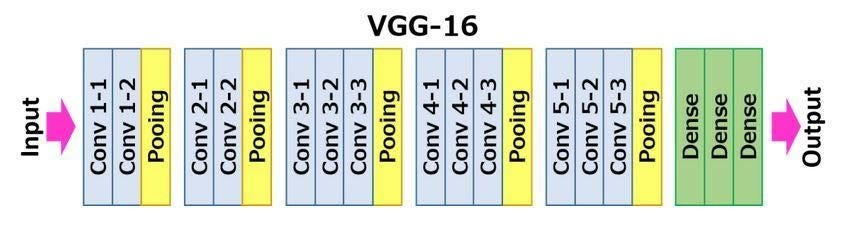

In the above, I imported the pretrained VGG 16 model's features i.e the convolutional part and I froze the gradients because I don't need to update them at all. The picture above shows the architecture of VGG 16, which is simple and only contains convolution and max pooling layers before the dense classifier layers. 

In this project I will need to pass my images through the model and extract style features from the first convolution layer of each block (i.e Conv1_1, conv2_1, conv3_1 ... etc), and extract content features from the second convolutional layer in the forth block i.e conv4_2 as done in the paper I will share in the references later.

In [3]:
def load_img(img_path, max_size = 400, shape = None):
    
    image = Image.open(img_path).convert("RGB")
    
    if max(image.size) > max_size:
        size = max_size
    else:
        size = max(image.size)
        
    if shape is not None:
        size = shape
        
    transform = transforms.Compose([
        transforms.Resize(size),
        transforms.ToTensor(),
        transforms.Normalize((0.485, 0.456, 0.406), 
                             (0.229, 0.224, 0.225))])
    image = transform(image).unsqueeze(0)
    
    return image

In this part I defined a function to load the images, resize them by either their own size (if it's under 400) or 400 in order to avoid having big images, then I transformed them into tensor and normalized them, finally I added the batch size dimention and returned the machine learning ready output.

In [4]:
planets = load_img(r'C:\Users\imane\OneDrive\Desktop\style_transfer\planets.jpg')
cherry = load_img(r'C:\Users\imane\OneDrive\Desktop\style_transfer\cherry.jpg', shape = planets.shape[2:])

In [5]:
planets.size()

torch.Size([1, 3, 400, 588])

In [6]:
cherry.size()

torch.Size([1, 3, 400, 588])

In [7]:
def im_convert(tensor):
    
    image = tensor.clone().detach()
    image = image.numpy().squeeze()
    image = image.transpose(1,2,0)
    image = image * np.array((0.229, 0.224, 0.225)) + np.array((0.485, 0.456, 0.406))
    image = image.clip(0, 1)

    return image

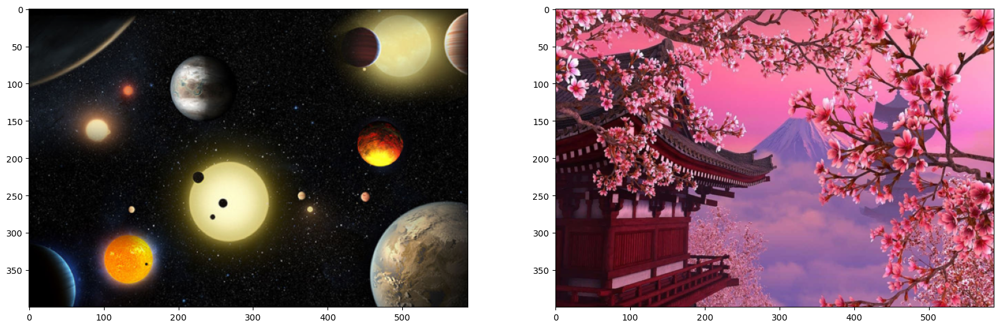

In [8]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (20,10))
ax1.imshow(im_convert(planets))
ax2.imshow(im_convert(cherry))

So I imported the images, checked their size and defined the function to plot them (unormalize and convert to numpy), then I plotted them. On the left side is the content image (planets), and on the right side is the style image (cherry blossom).

In [9]:
model

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (17): Conv2d(256, 512, kernel_si

In [10]:
def get_features(image, model, layers=None):

    if layers is None:
        layers = {'0': 'conv1_1',
                  '5': "conv2_1",
                  '10': "conv3_1",
                  '19': "conv4_1",
                  '21': "conv4_2",
                  "28": 'conv5_1'}
        

    features = {}
    x = image

    for name, layer in model._modules.items():
        x = layer(x)
        if name in layers:
            features[layers[name]] = x
            
    return features

In [11]:
def gram_matrix(tensor):
    _, d, h, w = tensor.size()
    tensor = tensor.view(d, h*w)
    gram = torch.mm(tensor, tensor.t())
    return gram

Then I defined the function that extracts fetures for the style and content and stored them in a dict with the keys being the layers' names and then values being the features. Like mentioned above, the style features are taken from every first conv layer in the block in order to get an overall view of style features extracted at each level of depth, and the content features will be extracted from the second layer in the fourth block.

Then I defined the gram matrix function, the gram matrix is how we get the style present in a picture. It consits of flattening the activation map and multuplying it by its transpose.

In [12]:
planets_features = get_features(planets, model)
cherry_features = get_features(cherry, model)
cherry_grams = {layer : gram_matrix(cherry_features[layer]) for layer in cherry_features}
target_1 = planets.clone().requires_grad_(True)

In [13]:
style_weights = {"conv1_1": 1.,
                  "conv2_1": 0.8,
                  "conv3_1": 0.5,
                  "conv4_1": 0.3,
                  "conv5_1": 0.1}
content_weight = 1
style_weight = 1e6

So next, I extracted the style and content features, I created the gram matrices and cloned the content image under target and sat the requires grad to true because the network will be updating this target image each iteration.

Then I defined the style weights which are the weights that will be multiplied by the difference between the target gram matrix and style gram matrix in order to give different importances to the error generated by each set of layers. 

Then I set up the style and content weights which are the weights that will be multiplied by the final content and style losses. The content weight is 1 while the style weight is 1e6 to focus more on the style resemblance between the pictures.

I then chose 6000 steps and decided to show the result every 400 steps (15 images shown total). I sat the optimizer to Adam and the target photo as the target to optimize. Through the steps loop I calculated the content and loss features, multiplied them by the weights, got the final loss and used backpropagation to update the target picture.

Total loss 87644600.0


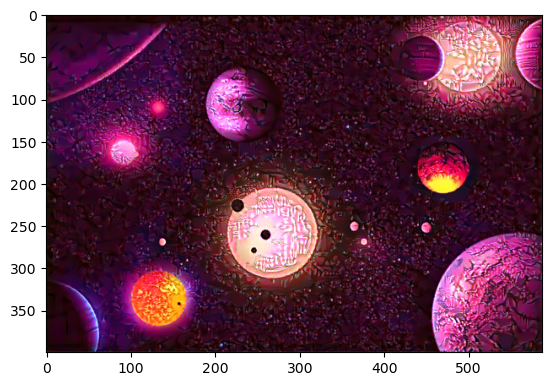

Total loss 21655598.0


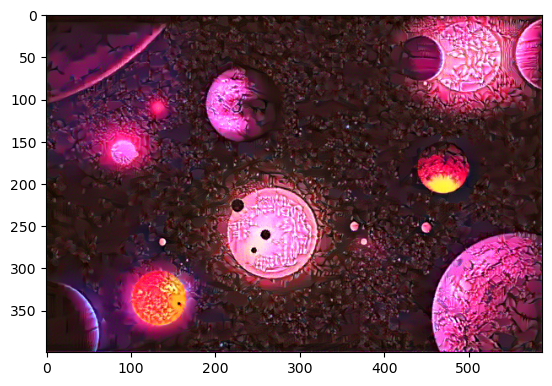

Total loss 12706597.0


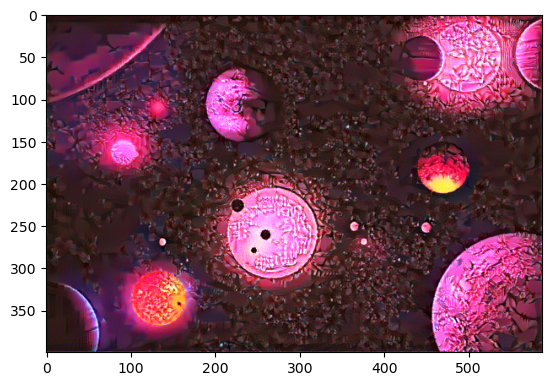

Total loss 8592152.0


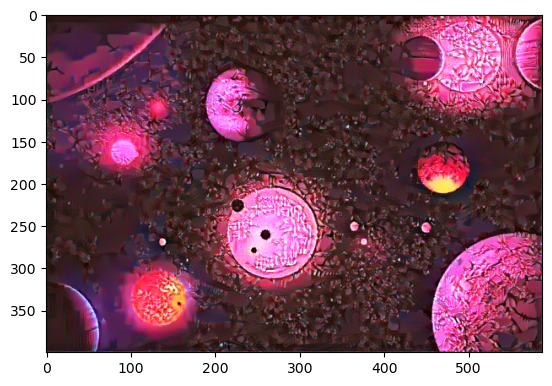

Total loss 6060163.5


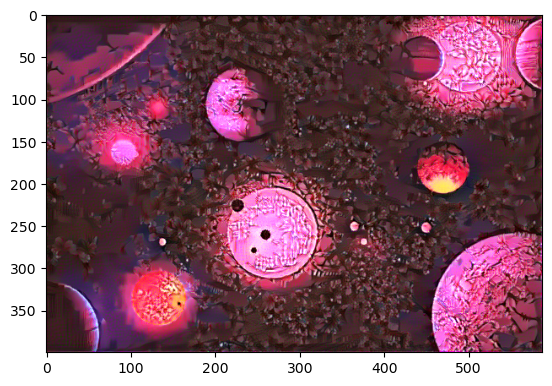

Total loss 4371659.0


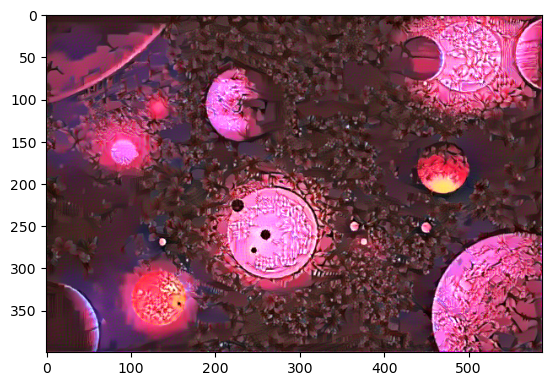

Total loss 3207103.0


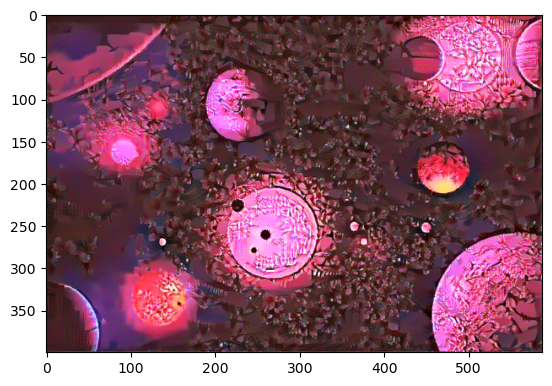

Total loss 2384936.75


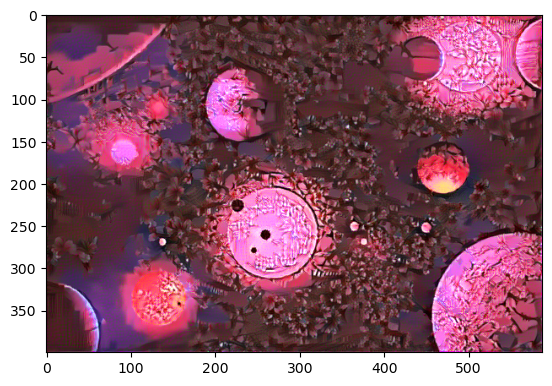

Total loss 1791163.125


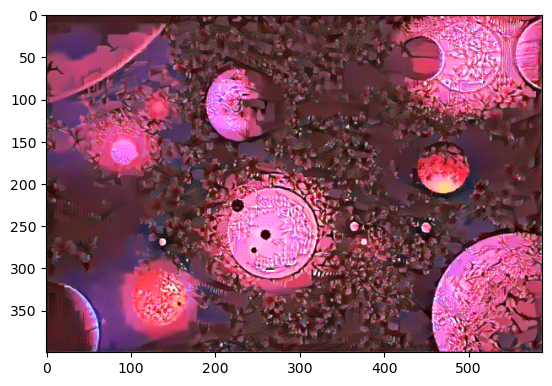

Total loss 1356923.875


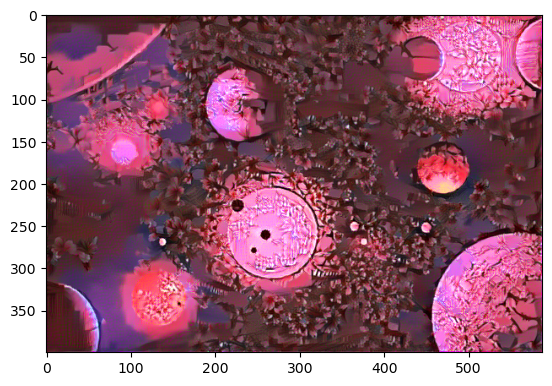

Total loss 1034153.0625


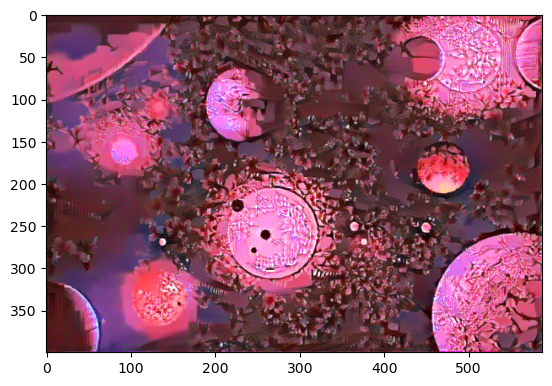

Total loss 792675.5625


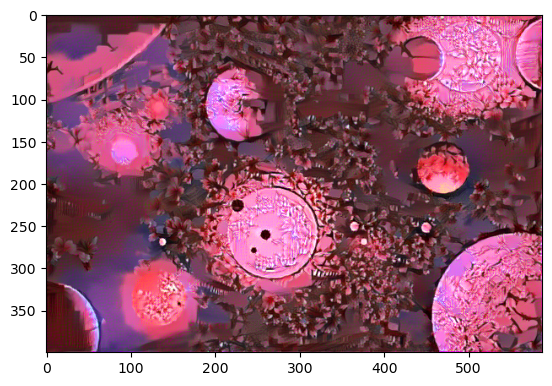

Total loss 609429.25


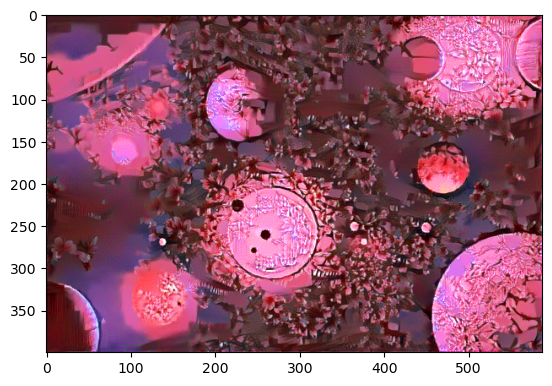

Total loss 469733.1875


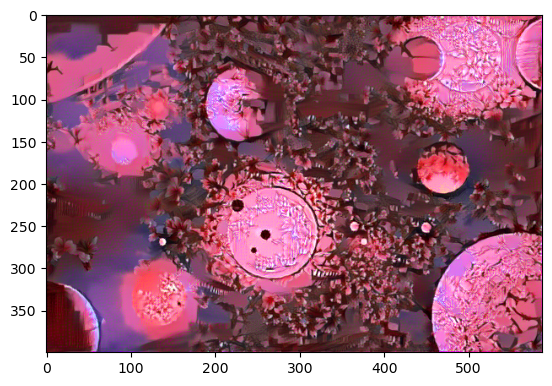

Total loss 364634.625


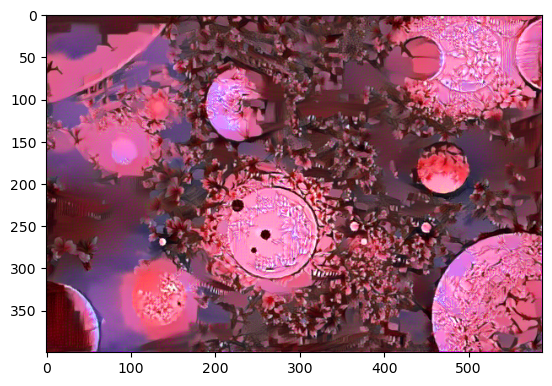

In [14]:
show_every = 400
optimizer = optim.Adam([target_1], lr= 0.005)
steps = 6000

for step in range(1, steps+1):
    target_features = get_features(target_1, model)
    content_loss = torch.mean((target_features["conv4_2"] - planets_features["conv4_2"])**2)
    
    style_loss = 0
    for layer in style_weights:
        target_feature = target_features[layer]
        _, d, h, w = target_feature.size()
        
        target_gram = gram_matrix(target_feature)
        style_gram = cherry_grams[layer]
        layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram)**2)
        
        style_loss += layer_style_loss /(d*h*w)
    
    total_loss = (content_weight* content_loss) + (style_weight* style_loss)
    
    optimizer.zero_grad()
    total_loss.backward()
    optimizer.step()
    
    if step % show_every == 0:
        print("Total loss", total_loss.item())
        plt.imshow(im_convert(target_1))
        plt.show()

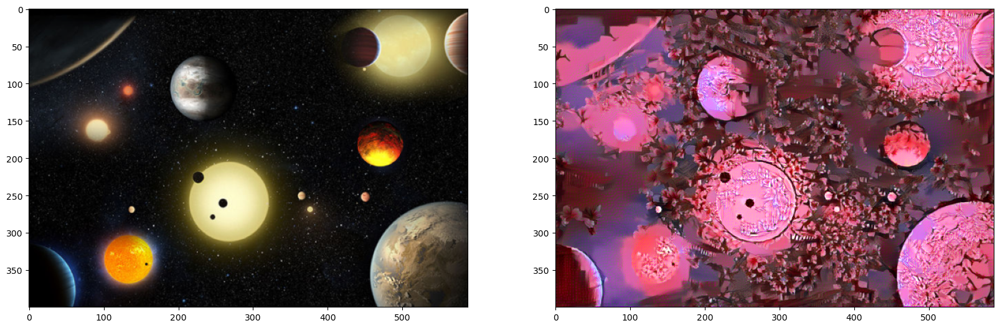

In [15]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
ax1.imshow(im_convert(planets))
ax2.imshow(im_convert(target_1))